In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import sys
print(sys.version)

3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


In [3]:
!git clone https://github.com/mannadamay12/tile2net-segD
%cd tile2net-segD

Cloning into 'tile2net-segD'...
remote: Enumerating objects: 2338, done.
remote: Counting objects: 100% (1157/1157), done.
remote: Compressing objects: 100% (308/308), done.
remote: Total 2338 (delta 966), reused 853 (delta 847), pack-reused 1181 (from 2)
Receiving objects: 100% (2338/2338), 7.40 MiB | 27.64 MiB/s, done.
Resolving deltas: 100% (1437/1437), done.
/kaggle/working/tile2net-segD


In [4]:
!pip install -e .

Obtaining file:///kaggle/working/tile2net-segD
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 33.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 338.4/338.4 kB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.6/84.6 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 68.5 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 25.2 MB/s eta 0:00:00:00:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 k

In [7]:
import torch
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"GPU: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'None'}")

CUDA available: True
GPU: Tesla T4


In [8]:
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import sys

In [9]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 64.0 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=e5306ab54c0fb65e7c0f19bfa8089ad568afe07f1d15ef07ce406dfffba07959
  Stored in directory: /root/.cache/pip/wheels/bc/52/78/893c3b94279ef238f43a9e89608af648de401b96415bebbd1f
Successfully built grad-cam


In [10]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [11]:
!bash ./examples/example.sh < <(echo "")

Please enter the output directory:
Tile generation will now begin.
INFO       NumExpr defaulting to 4 threads.
INFO       NumExpr defaulting to 4 threads.
INFO       Using Massachusetts as the source at location=(42.3536483721, -71.0716891532, 42.3555518995, -71.0643742337)
INFO       Using base_tilesize=256 from source
INFO       Stitching 12 tiles...
INFO       96 tiles missing out of 96 total.
INFO       All 96 tiles are on disk.
           Stitching 6 tiles...                   : 100%|█| 6/6 [00:00<00:00, 12
INFO       Dumping to /tmp/tile2net/example/tiles/example_256_info.json
INFO       Inferencing. Segmentation results will not be saved.
INFO       Downloading weights for segmentation, this may take a while...
INFO       Weights downloaded.
INFO       Using a single GPU.
INFO       Using Per Image based weighted loss
INFO       Using Cross Entropy Loss
INFO       Loading weights from: checkpoint=/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellit

In [12]:
import json

city_info_path = "/tmp/tile2net/example/tiles/example_256_info.json"
with open(city_info_path) as f:
    city_info = json.load(f)

# See what keys exist
print("Available keys:")
print(json.dumps(city_info, indent=2))

Available keys:
{
  "name": "example",
  "bbox": [
    42.3519474764,
    42.3560069067,
    -71.0719299316,
    -71.0636901855
  ],
  "location": [
    42.3536483721,
    -71.0716891532,
    42.3555518995,
    -71.0643742337
  ],
  "size": 1024,
  "zoom": 19,
  "crs": 4326,
  "tile_step": 4,
  "project": {
    "config": "/kaggle/working/tile2net-segD/src/tile2net/tileseg/config.py",
    "assets": {
      "weights": {
        "satellite_2021": "/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_2021.pth",
        "hrnetv2_w48_imagenet_pretrained": "/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth"
      }
    },
    "segmentation": "/tmp/tile2net/example/segmentation/example/256_19_4",
    "tiles": {
      "info": "/tmp/tile2net/example/tiles/example_256_info.json",
      "static": "/tmp/tile2net/example/tiles/static/ma/256_19",
      "stitched": "/tmp/tile2net/example/tiles/stitched/256_19_

In [13]:
import sys
import os
sys.path.insert(0, '/kaggle/working/tile2net-segD/src')

import torch
from tile2net.tileseg.network.ocrnet import MscaleOCR
from tile2net.tileseg.config import cfg

# Set config
cfg.MODEL.ARCH = 'ocrnet.HRNet_Mscale'
cfg.DATASET.NUM_CLASSES = 4
cfg.MODEL.OCR.MID_CHANNELS = 512
cfg.MODEL.OCR.KEY_CHANNELS = 256
cfg.MODEL.BNFUNC = torch.nn.BatchNorm2d
cfg.MODEL.HRNET_CHECKPOINT = '/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth'

checkpoint_path = '/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_2021.pth'

# Create model
net = MscaleOCR(num_classes=4, trunk='hrnetv2', criterion=None)

checkpoint = torch.load(checkpoint_path, map_location='cpu', weights_only=False)
state_dict = checkpoint['state_dict']

from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in state_dict.items():
  name = k[7:] if k.startswith('module.') else k
  new_state_dict[name] = v

net.load_state_dict(new_state_dict)
net = net.cuda().eval()

print("\nModel loaded successfully!")
print(f"Model type: {type(net)}")
print(f"Model on CUDA: {next(net.parameters()).is_cuda}")

INFO       init weights from normal distribution
INFO       loading pretrained model /kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth
INFO       Trunk: hrnetv2



Model loaded successfully!
Model type: <class 'tile2net.tileseg.network.ocrnet.MscaleOCR'>
Model on CUDA: True


In [14]:
from pathlib import Path
import os

# Check the specific tile directories
static_dir = Path('/tmp/tile2net/example/tiles/static/ma/256_19')
stitched_dir = Path('/tmp/tile2net/example/tiles/stitched/256_19_4')

print("Static tiles directory:")
print(f"  Path: {static_dir}")
print(f"  Exists: {static_dir.exists()}")
if static_dir.exists():
  files = list(static_dir.iterdir())
  print(f"  Files: {len(files)}")
  if files:
      print(f"  First 5: {[f.name for f in files[:5]]}")
  else:
      print("  (empty directory)")

print("\nStitched tiles directory:")
print(f"  Path: {stitched_dir}")
print(f"  Exists: {stitched_dir.exists()}")
if stitched_dir.exists():
  files = list(stitched_dir.iterdir())
  print(f"  Files: {len(files)}")
  if files:
      print(f"  First 5: {[f.name for f in files[:5]]}")
  else:
      print("  (empty directory)")

print("\nChecking for other image formats...")
base = Path('/tmp/tile2net/example')
jpgs = list(base.rglob('*.jpg'))
jpegs = list(base.rglob('*.jpeg'))
print(f"  JPG files: {len(jpgs)}")
print(f"  JPEG files: {len(jpegs)}")

if jpgs or jpegs:
  sample = (jpgs + jpegs)[0]
  print(f"  Sample: {sample}")

Static tiles directory:
  Path: /tmp/tile2net/example/tiles/static/ma/256_19
  Exists: True
  Files: 96
  First 5: ['158641_193925.jpg', '158644_193928.jpg', '158642_193925.jpg', '158644_193927.jpg', '158644_193932.jpg']

Stitched tiles directory:
  Path: /tmp/tile2net/example/tiles/stitched/256_19_4
  Exists: True
  Files: 6
  First 5: ['2_1_5.jpg', '0_1_1.jpg', '1_1_3.jpg', '2_0_4.jpg', '1_0_2.jpg']

Checking for other image formats...
  JPG files: 102
  JPEG files: 0
  Sample: /tmp/tile2net/example/tiles/static/ma/256_19/158641_193925.jpg


Loading: /tmp/tile2net/example/tiles/stitched/256_19_4/2_1_5.jpg
Image shape: (1024, 1024, 3)
Image size: (1024, 1024)
Input shape: torch.Size([1, 3, 1024, 1024])
Input range: [-1.912, 2.640]


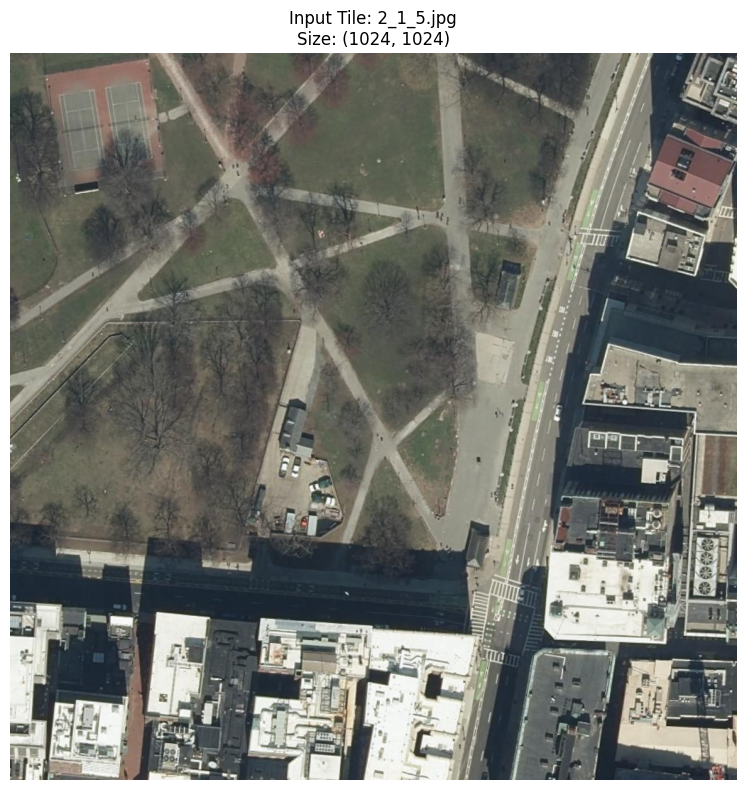

In [15]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from pathlib import Path

# Use stitched tiles (larger, better context)
stitched_dir = Path('/tmp/tile2net/example/tiles/stitched/256_19_4')
tile_path = list(stitched_dir.glob('*.jpg'))[0]

print(f"Loading: {tile_path}")

# Load image
img = Image.open(tile_path).convert('RGB')
img_array = np.array(img)

print(f"Image shape: {img_array.shape}")
print(f"Image size: {img.size}")

# Prepare for model (Tile2Net preprocessing)
img_normalized = img_array.astype(np.float32) / 255.0

transform = transforms.Compose([
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406],
                     std=[0.229, 0.224, 0.225])
])

input_tensor = transform(img).unsqueeze(0).cuda()

print(f"Input shape: {input_tensor.shape}")
print(f"Input range: [{input_tensor.min():.3f}, {input_tensor.max():.3f}]")

# Visualize
plt.figure(figsize=(8, 8))
plt.imshow(img)
plt.title(f"Input Tile: {tile_path.name}\nSize: {img.size}")
plt.axis('off')
plt.tight_layout()
plt.show()

In [16]:
from tile2net.namespace import torch_version_float

# Set required config values
cfg.OPTIONS.TORCH_VERSION = torch_version_float()
cfg.MODEL.MSCALE = True 
cfg.MODEL.MSCALE_LO_SCALE = 0.5  # Default low-res scale

print(f"Torch version: {cfg.OPTIONS.TORCH_VERSION}")
print(f"Multi-scale enabled: {cfg.MODEL.MSCALE}")
print(f"Low-res scale: {cfg.MODEL.MSCALE_LO_SCALE}")
print("\n✓ Config fixed!")

Torch version: 2.6
Multi-scale enabled: True
Low-res scale: 0.5

✓ Config fixed!


Running inference...
Output shape: torch.Size([1, 4, 1024, 1024])


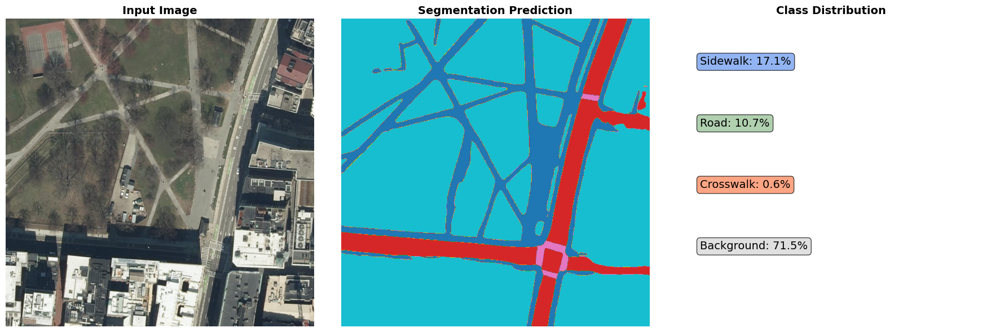


Inference complete!
Unique classes in prediction: [0 1 2 3]


In [21]:
# Run model
print("Running inference...")
with torch.no_grad():
  output = net({'images': input_tensor})

# Handle output
if isinstance(output, dict):
  pred_logits = output.get('pred', output.get('out', list(output.values())[0]))
else:
  pred_logits = output

print(f"Output shape: {pred_logits.shape}")

# Get prediction mask
pred_mask = pred_logits.argmax(dim=1).cpu().numpy()[0]

# Visualize
class_names = ['Sidewalk', 'Road', 'Crosswalk', 'Background']
class_colors = ['cornflowerblue', 'darkseagreen', 'coral', 'lightgray']

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Input
axes[0].imshow(img)
axes[0].set_title('Input Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Prediction
im = axes[1].imshow(pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].set_title('Segmentation Prediction', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Stats
axes[2].axis('off')
axes[2].set_xlim(0, 1)
axes[2].set_ylim(0, 1)
for i in range(4):
  mask = pred_mask == i
  pct = mask.sum() / mask.size * 100
  axes[2].text(0.1, 0.85 - i*0.2,
              f"{class_names[i]}: {pct:.1f}%",
              fontsize=14,
              bbox=dict(boxstyle='round', facecolor=class_colors[i], alpha=0.7,
edgecolor='black'))
axes[2].set_title('Class Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

print("\nInference complete!")
print(f"Unique classes in prediction: {np.unique(pred_mask)}")

In [22]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget

# Inspect HRNet structure
print("=" * 70)
print("HRNet-W48 Backbone Structure for GradCAM")
print("=" * 70)

stage_info = {}
for name, module in net.backbone.named_children():
  if 'stage' in name or 'transition' in name:
      print(f"\n{name}: {type(module).__name__}")
      if hasattr(module, '__len__'):
          print(f"  Num blocks: {len(module)}")
          if 'stage' in name and hasattr(module[-1], 'branches'):
              num_branches = len(module[-1].branches)
              print(f"  Branches: {num_branches} (multi-resolution)")
              stage_info[name] = num_branches
              for i, branch in enumerate(module[-1].branches):
                  print(f"    Branch {i}: {len(branch)} blocks")

print("\n" + "=" * 70)
print("Recommended GradCAM Target Layers:")
print("=" * 70)
print("  stage2: 2 branches (high-res + low-res)")
print("  stage3: 3 branches (high + mid + low res)")
print("  stage4: 4 branches (multi-scale fusion)")
print("\nWe'll visualize how each stage focuses on different features!")
print("=" * 70)

HRNet-W48 Backbone Structure for GradCAM

transition1: ModuleList
  Num blocks: 2

stage2: Sequential
  Num blocks: 1
  Branches: 2 (multi-resolution)
    Branch 0: 4 blocks
    Branch 1: 4 blocks

transition2: ModuleList
  Num blocks: 3

stage3: Sequential
  Num blocks: 4
  Branches: 3 (multi-resolution)
    Branch 0: 4 blocks
    Branch 1: 4 blocks
    Branch 2: 4 blocks

transition3: ModuleList
  Num blocks: 4

stage4: Sequential
  Num blocks: 3
  Branches: 4 (multi-resolution)
    Branch 0: 4 blocks
    Branch 1: 4 blocks
    Branch 2: 4 blocks
    Branch 3: 4 blocks

Recommended GradCAM Target Layers:
  stage2: 2 branches (high-res + low-res)
  stage3: 3 branches (high + mid + low res)
  stage4: 4 branches (multi-scale fusion)

We'll visualize how each stage focuses on different features!


Generating GradCAM for class: Background
Class coverage: 71.5%
Processing Stage2-HighRes...
Processing Stage2-LowRes...
Processing Stage3-HighRes...
Processing Stage3-MidRes...
Processing Stage4-HighRes...
Processing Stage4-LowRes...


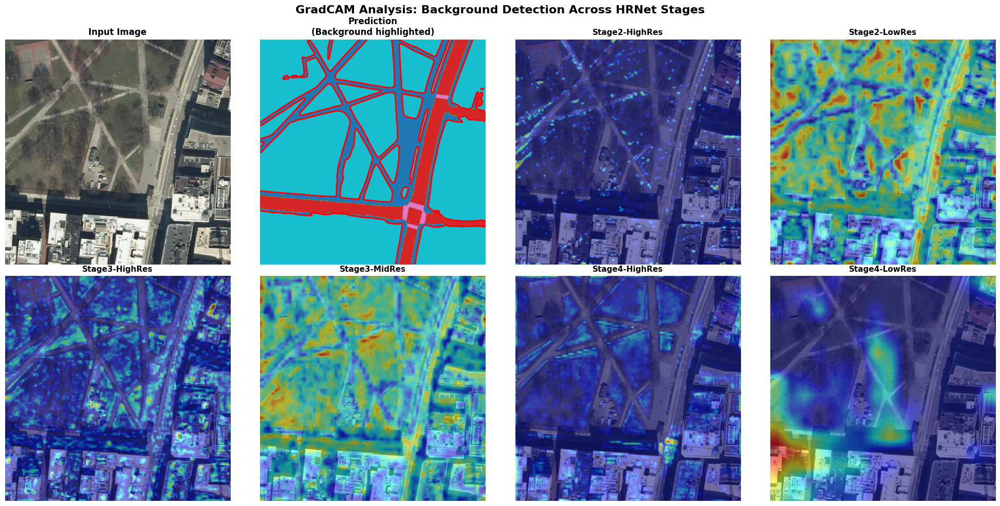


✓ GradCAM visualization complete!


In [23]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch.nn as nn

# Choose a class to explain (1=Sidewalk is usually interesting)
target_class = 3  # Sidewalk
class_mask = (pred_mask == target_class)

print(f"Generating GradCAM for class: {class_names[target_class]}")
print(f"Class coverage: {class_mask.sum() / class_mask.size * 100:.1f}%")

# Create a wrapper model that returns only the prediction tensor
class ModelWrapper(nn.Module):
  def __init__(self, model):
      super().__init__()
      self.model = model

  def forward(self, x):
      output = self.model({'images': x})
      # Return only the prediction logits (what GradCAM expects)
      if isinstance(output, dict):
          return output.get('pred', output.get('out', list(output.values())[0]))
      return output

wrapped_net = ModelWrapper(net)
wrapped_net.eval()

# Copy the backbone reference for GradCAM to access
wrapped_net.backbone = net.backbone

# Define target layers from different HRNet stages
target_layers_dict = {
  'Stage2-HighRes': [wrapped_net.backbone.stage2[-1].branches[0][-1]],
  'Stage2-LowRes': [wrapped_net.backbone.stage2[-1].branches[1][-1]],
  'Stage3-HighRes': [wrapped_net.backbone.stage3[-1].branches[0][-1]],
  'Stage3-MidRes': [wrapped_net.backbone.stage3[-1].branches[1][-1]],
  'Stage4-HighRes': [wrapped_net.backbone.stage4[-1].branches[0][-1]],
  'Stage4-LowRes': [wrapped_net.backbone.stage4[-1].branches[3][-1]],
}

# Prepare target for GradCAM
targets = [SemanticSegmentationTarget(target_class, class_mask)]

# Generate CAMs
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

# Original image
axes[0].imshow(img)
axes[0].set_title('Input Image', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Prediction with target class highlighted
axes[1].imshow(pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].contour(class_mask, colors='red', linewidths=2)
axes[1].set_title(f'Prediction\n({class_names[target_class]} highlighted)',
               fontsize=12, fontweight='bold')
axes[1].axis('off')

# Generate GradCAM for each layer
for idx, (name, layers) in enumerate(target_layers_dict.items(), start=2):
  print(f"Processing {name}...")

  try:
      cam = GradCAM(model=wrapped_net, target_layers=layers)
      grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

      # Overlay on image
      cam_image = show_cam_on_image(img_normalized, grayscale_cam, use_rgb=True)

      axes[idx].imshow(cam_image)
      axes[idx].set_title(f'{name}', fontsize=11, fontweight='bold')
      axes[idx].axis('off')

      # Clean up
      del cam

  except Exception as e:
      print(f"  Error: {type(e).__name__}: {e}")
      axes[idx].text(0.5, 0.5, f'Error:\n{type(e).__name__}',
                    ha='center', va='center', fontsize=10)
      axes[idx].axis('off')

plt.suptitle(f'GradCAM Analysis: {class_names[target_class]} Detection Across HRNet Stages',
           fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

print("\n✓ GradCAM visualization complete!")

In [24]:
!pip3 freeze > requirements.txt 

In [20]:
# Verify class distribution
unique_classes = np.unique(pred_mask)
print(f"Classes in prediction: {unique_classes}")
print(f"Model NUM_CLASSES: {cfg.DATASET.NUM_CLASSES}")

for cls in unique_classes:
  count = (pred_mask == cls).sum()
  pct = count / pred_mask.size * 100
  print(f"  Class {cls}: {count:,} pixels ({pct:.2f}%)")

Classes in prediction: [0 1 2 3]
Model NUM_CLASSES: 4
  Class 0: 179,602 pixels (17.13%)
  Class 1: 112,505 pixels (10.73%)
  Class 2: 6,444 pixels (0.61%)
  Class 3: 750,025 pixels (71.53%)


Processing Sidewalk...
Processing Road...
Processing Crosswalk...
Processing Background...


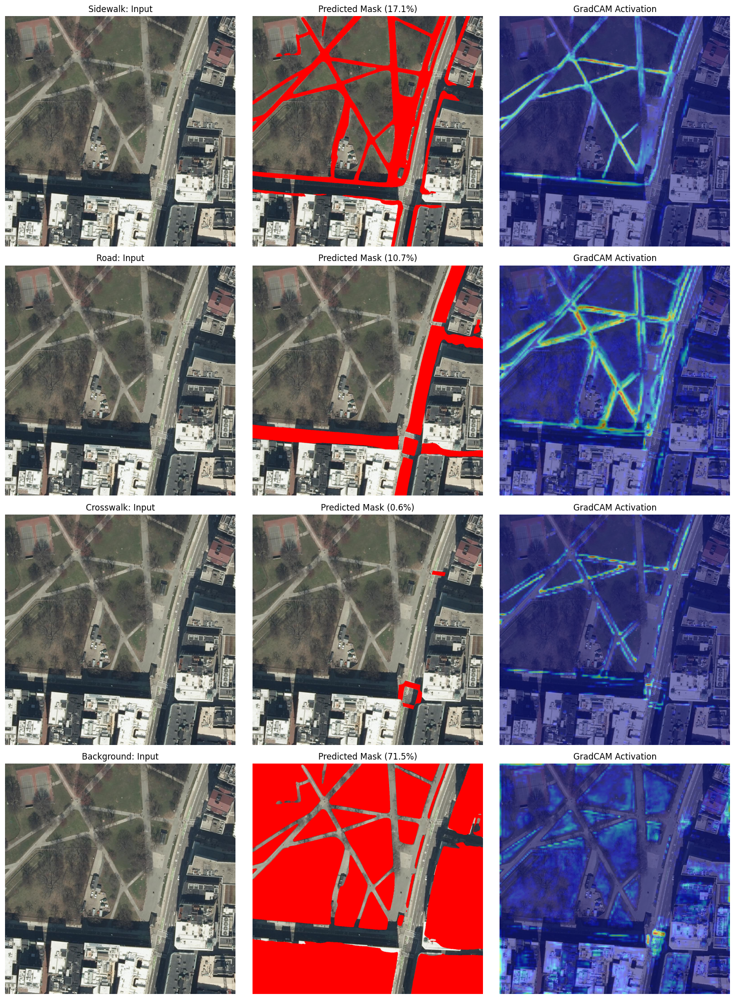

In [25]:
# Generate GradCAM for all classes
target_layers = [wrapped_net.backbone.stage4[-1].branches[0][-1]]  # Stage4 high-res

fig, axes = plt.subplots(4, 3, figsize=(15, 20))

for class_idx in range(4):
  class_mask = (pred_mask == class_idx)

  if class_mask.sum() == 0:
      print(f"Skipping {class_names[class_idx]} - no pixels detected")
      continue

  print(f"Processing {class_names[class_idx]}...")

  targets = [SemanticSegmentationTarget(class_idx, class_mask)]
  cam = GradCAM(model=wrapped_net, target_layers=target_layers)
  grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
  cam_image = show_cam_on_image(img_normalized, grayscale_cam, use_rgb=True)

  # Original
  axes[class_idx, 0].imshow(img)
  axes[class_idx, 0].set_title(f'{class_names[class_idx]}: Input')
  axes[class_idx, 0].axis('off')

  # Mask
  mask_overlay = img.copy()
  mask_overlay = np.array(mask_overlay)
  mask_overlay[class_mask] = [255, 0, 0]  # Highlight in red
  axes[class_idx, 1].imshow(mask_overlay)
  axes[class_idx, 1].set_title(f'Predicted Mask ({class_mask.sum()/class_mask.size*100:.1f}%)')
  axes[class_idx, 1].axis('off')

  # GradCAM
  axes[class_idx, 2].imshow(cam_image)
  axes[class_idx, 2].set_title('GradCAM Activation')
  axes[class_idx, 2].axis('off')

  del cam

plt.tight_layout()
plt.show()

In [29]:
from tile2net import Raster

# Choose a location in NYC
# Washington Square Park (good mix of sidewalks, roads, crosswalks)
nyc_location = "Washington Square Park, Manhattan, NY"

# Or use specific coordinates [north_lat, west_lon, south_lat, east_lon]
nyc_bbox = [40.7310, -73.9990, 40.7285, -73.9950]  # Around Washington Square

print(f"Generating NYC tile for: {nyc_location}")

# Create raster
raster = Raster(
  location=nyc_bbox,
  zoom=19,
  name='nyc_example',
  output_dir='/tmp/tile2net/'
)

# Generate tiles (download imagery)
print("\nDownloading tiles...")
raster.generate(4)

print("\n✓ NYC tiles generated!")
print(f"Project directory: {raster.city_info}")

INFO       Found multiple sources for the location, in descending IOU: ['nyc', 'ny'] and chose nyc (('New York City', 'City of New York'))
INFO       Using NewYorkCity as the source at location=(40.7285, -73.999, 40.731, -73.995)
INFO       Using base_tilesize=256 from source
INFO       Stitching 6 tiles...
INFO       64 tiles missing out of 64 total.


Generating NYC tile for: Washington Square Park, Manhattan, NY



INFO       All 64 tiles are on disk.
           Stitching 4 tiles...                   : 100%|██████████| 4/4 [00:00<00:00, 12.82it/s]
INFO       Dumping to /tmp/tile2net/nyc_example/tiles/nyc_example_256_info.json


{
    "config": "/kaggle/working/tile2net-segD/src/tile2net/tileseg/config.py",
    "assets": {
        "weights": {
            "satellite_2021": "/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_2021.pth",
            "hrnetv2_w48_imagenet_pretrained": "/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth"
        }
    },
    "segmentation": "/tmp/tile2net/nyc_example/segmentation/nyc_example/256_19_4",
    "tiles": {
        "info": "/tmp/tile2net/nyc_example/tiles/nyc_example_256_info.json",
        "static": "/tmp/tile2net/nyc_example/tiles/static/nyc/256_19",
        "stitched": "/tmp/tile2net/nyc_example/tiles/stitched/256_19_4"
    },
    "polygons": "/tmp/tile2net/nyc_example/polygons",
    "network": "/tmp/tile2net/nyc_example/network",
    "name": "nyc_example"
}
✓ NYC tiles generated!


AttributeError: 'Raster' object has no attribute 'project_folder'

In [33]:
# Run inference
print("Running segmentation inference...")
raster.inference()

print("\n✓ Inference complete!")

# Get the city info path for the NYC tile
nyc_city_info_path = raster.city_info
print(f"City info: {nyc_city_info_path}")

Running segmentation inference...

✓ Inference complete!


AttributeError: 'Raster' object has no attribute 'city_info'

NYC Tile Info:
{
  "name": "nyc_example",
  "bbox": [
    40.7269660663,
    40.731128806,
    -73.9990997314,
    -73.9936065674
  ],
  "location": [
    40.7285,
    -73.999,
    40.731,
    -73.995
  ],
  "size": 1024,
  "zoom": 19,
  "crs": 4326,
  "tile_step": 4,
  "project": {
    "config": "/kaggle/working/tile2net-segD/src/tile2net/tileseg/config.py",
    "assets": {
      "weights": {
        "satellite_2021": "/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_2021.pth",
        "hrnetv2_w48_imagenet_pretrained": "/kaggle/working/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth"
      }
    },
    "segmentation": "/tmp/tile2net/nyc_example/segmentation/nyc_example/256_19_4",
    "tiles": {
      "info": "/tmp/tile2net/nyc_example/tiles/nyc_example_256_info.json",
      "static": "/tmp/tile2net/nyc_example/tiles/static/nyc/256_19",
      "stitched": "/tmp/tile2net/nyc_example/tiles/stitched/256_19_

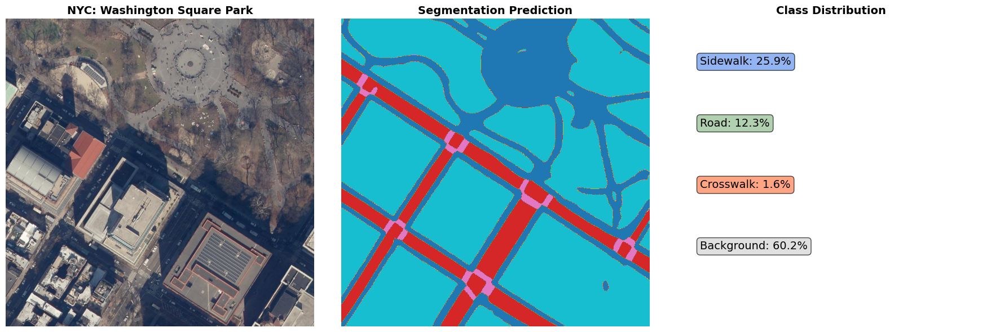


✓ Prediction complete!
Shape: (1024, 1024)
Classes present: [0 1 2 3]


In [39]:
import json
from pathlib import Path
import numpy as np
from PIL import Image
from torchvision import transforms

# Load NYC city info
nyc_city_info_path = "/tmp/tile2net/nyc_example/tiles/nyc_example_256_info.json"
with open(nyc_city_info_path) as f:
  nyc_city_info = json.load(f)

print("NYC Tile Info:")
print(json.dumps(nyc_city_info, indent=2))

# Load stitched tile (fix: use .png instead of .jpg)
stitched_dir = Path(nyc_city_info['project']['tiles']['stitched'])
nyc_tiles = list(stitched_dir.glob('*.png'))
print(f"\nFound {len(nyc_tiles)} stitched tiles")

# Load first tile
nyc_tile_path = nyc_tiles[0]
print(f"Loading: {nyc_tile_path}")

nyc_img = Image.open(nyc_tile_path).convert('RGB')
nyc_img_array = np.array(nyc_img)
nyc_img_normalized = nyc_img_array.astype(np.float32) / 255.0

# Prepare for model
transform = transforms.Compose([
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406],
                      std=[0.229, 0.224, 0.225])
])

nyc_input_tensor = transform(nyc_img).unsqueeze(0).cuda()

# Run inference
print("\nRunning inference...")
with torch.no_grad():
  nyc_output = net({'images': nyc_input_tensor})

if isinstance(nyc_output, dict):
  nyc_pred_logits = nyc_output.get('pred', nyc_output.get('out', list(nyc_output.values())[0]))
else:
  nyc_pred_logits = nyc_output

nyc_pred_mask = nyc_pred_logits.argmax(dim=1).cpu().numpy()[0]

# Visualize
class_names = ['Sidewalk', 'Road', 'Crosswalk', 'Background']
class_colors = ['cornflowerblue', 'darkseagreen', 'coral', 'lightgray']

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(nyc_img)
axes[0].set_title('NYC: Washington Square Park', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(nyc_pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].set_title('Segmentation Prediction', fontsize=14, fontweight='bold')
axes[1].axis('off')

axes[2].axis('off')
for i in range(4):
  pct = (nyc_pred_mask == i).sum() / nyc_pred_mask.size * 100
  axes[2].text(0.1, 0.85 - i*0.2,
              f"{class_names[i]}: {pct:.1f}%",
              fontsize=14,
              bbox=dict(boxstyle='round', facecolor=class_colors[i], alpha=0.7))
axes[2].set_title('Class Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

print(f"\n✓ Prediction complete!")
print(f"Shape: {nyc_pred_mask.shape}")
print(f"Classes present: {np.unique(nyc_pred_mask)}")

In [38]:
# Check what files exist
static_dir = Path(nyc_city_info['project']['tiles']['static'])
segmentation_dir = Path(nyc_city_info['project']['segmentation'])

print(f"Static tiles directory: {static_dir}")
print(f"Exists: {static_dir.exists()}")
if static_dir.exists():
  static_tiles = list(static_dir.glob('*.jpg'))
  print(f"Found {len(static_tiles)} static tiles")
  if static_tiles:
      print(f"First few: {[t.name for t in static_tiles[:5]]}")

print(f"\nSegmentation directory: {segmentation_dir}")
print(f"Exists: {segmentation_dir.exists()}")
if segmentation_dir.exists():
  seg_files = list(segmentation_dir.glob('*'))
  print(f"Found {len(seg_files)} files")
  if seg_files:
      print(f"Files: {[f.name for f in seg_files[:10]]}")

# Also check stitched directory
print(f"\nStitched directory: {stitched_dir}")
print(f"Exists: {stitched_dir.exists()}")
if stitched_dir.exists():
  all_files = list(stitched_dir.glob('*'))
  print(f"All files: {all_files}")

Static tiles directory: /tmp/tile2net/nyc_example/tiles/static/nyc/256_19
Exists: True
Found 0 static tiles

Segmentation directory: /tmp/tile2net/nyc_example/segmentation/nyc_example/256_19_4
Exists: False

Stitched directory: /tmp/tile2net/nyc_example/tiles/stitched/256_19_4
Exists: True
All files: [PosixPath('/tmp/tile2net/nyc_example/tiles/stitched/256_19_4/0_0_0.png'), PosixPath('/tmp/tile2net/nyc_example/tiles/stitched/256_19_4/1_1_3.png'), PosixPath('/tmp/tile2net/nyc_example/tiles/stitched/256_19_4/0_1_1.png'), PosixPath('/tmp/tile2net/nyc_example/tiles/stitched/256_19_4/1_0_2.png')]


In [41]:
import requests
import geopandas as gpd

# Get NYC bounding box
nyc_bbox = nyc_city_info['bbox']  # [north, south, west, east]
north, south, west, east = nyc_bbox[0], nyc_bbox[1], nyc_bbox[2], nyc_bbox[3]

print(f"NYC Bbox:")
print(f"  North: {north:.6f}")
print(f"  South: {south:.6f}")
print(f"  West: {west:.6f}")
print(f"  East: {east:.6f}")

# Download sidewalk ground truth
sidewalk_url = "https://data.cityofnewyork.us/resource/52n9-sdep.geojson"

params = {
  "$where": f"within_box(the_geom, {north}, {west}, {south}, {east})",
  "$limit": 50000
}

print(f"\nDownloading NYC sidewalk ground truth...")
print(f"Query: within_box(the_geom, {north}, {west}, {south}, {east})")

response = requests.get(sidewalk_url, params=params, timeout=30)

if response.status_code == 200:
  gt_dir = Path("/tmp/tile2net/nyc_example/ground_truth")
  gt_dir.mkdir(parents=True, exist_ok=True)

  gt_path = gt_dir / "nyc_sidewalks.geojson"
  gt_path.write_text(response.text)

  sidewalks_gdf = gpd.read_file(gt_path)

  print(f"✓ Downloaded {len(sidewalks_gdf)} sidewalk features")

  if len(sidewalks_gdf) > 0:
      print(f"\nCRS: {sidewalks_gdf.crs}")
      print(f"Columns: {list(sidewalks_gdf.columns)}")
      print(f"Geometry types: {sidewalks_gdf.geometry.type.value_counts().to_dict()}")
      print(f"\nSample feature:")
      print(sidewalks_gdf.iloc[0][['geometry']])
  else:
      print("\n⚠ No sidewalks found in this bounding box")
else:
  print(f"✗ Error {response.status_code}")
  print(response.text[:500])

NYC Bbox:
  North: 40.726966
  South: 40.731129
  West: -73.999100
  East: -73.993607

Query: within_box(the_geom, 40.7269660663, -73.9990997314, 40.731128806, -73.9936065674)
✓ Downloaded 15 sidewalk features

CRS: EPSG:4326
Columns: ['shape_area', 'shape_leng', 'feat_code', 'status', 'sub_code', 'source_id', 'geometry']
Geometry types: {'MultiPolygon': 15}

Sample feature:
geometry    MULTIPOLYGON (((-73.99815688478438 40.72758756...
Name: 0, dtype: object


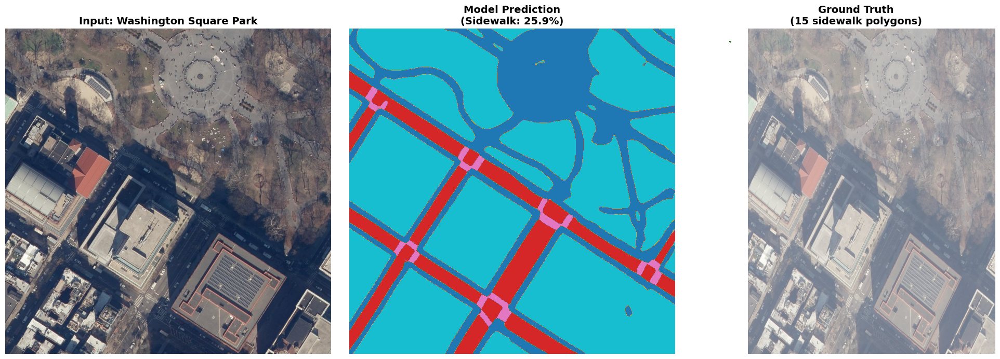


✓ Ground truth loaded: 15 sidewalk polygons
Total ground truth area: 0.000001 sq degrees


/tmp/ipykernel_39/3641182621.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(f"Total ground truth area: {sidewalks_gdf.geometry.area.sum():.6f} sq degrees")


In [42]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

# Original image
axes[0].imshow(nyc_img)
axes[0].set_title('Input: Washington Square Park', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Prediction
axes[1].imshow(nyc_pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].set_title(f'Model Prediction\n(Sidewalk: {(nyc_pred_mask==0).sum()/nyc_pred_mask.size*100:.1f}%)',
               fontsize=14, fontweight='bold')
axes[1].axis('off')

# Ground truth - we need to rasterize it to overlay properly
# For now, just show the count
axes[2].imshow(nyc_img, alpha=0.6)
axes[2].set_title(f'Ground Truth\n({len(sidewalks_gdf)} sidewalk polygons)',
               fontsize=14, fontweight='bold')
axes[2].axis('off')

# Try to plot ground truth (note: coordinate systems may not align perfectly yet)
try:
  sidewalks_gdf.plot(ax=axes[2], color='lime', alpha=0.8, edgecolor='darkgreen', linewidth=2)
except Exception as e:
  print(f"Note: {e}")
  axes[2].text(0.5, 0.5, f'{len(sidewalks_gdf)} sidewalk features\n(needs coordinate alignment)',
              ha='center', va='center', transform=axes[2].transAxes,
              fontsize=12, bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8))

plt.tight_layout()
plt.show()

print(f"\n✓ Ground truth loaded: {len(sidewalks_gdf)} sidewalk polygons")
print(f"Total ground truth area: {sidewalks_gdf.geometry.area.sum():.6f} sq degrees")

In [45]:
from rasterio import features
from rasterio.transform import from_bounds
from shapely.geometry import shape
import geopandas as gpd
import pandas as pd

# Get tile geographic bounds (in EPSG:4326 / WGS84)
tile_bounds = nyc_city_info['bbox']  # [north, south, west, east]
north, south, west, east = tile_bounds[0], tile_bounds[1], tile_bounds[2], tile_bounds[3]

print(f"Tile bounds: N={north:.6f}, S={south:.6f}, W={west:.6f}, E={east:.6f}")
print(f"Prediction shape: {nyc_pred_mask.shape}")

# Create affine transform (maps pixel coords to geographic coords)
# Arguments: west, south, east, north, width, height
height, width = nyc_pred_mask.shape
transform = from_bounds(west, south, east, north, width, height)

print(f"Transform: {transform}")
print(f"Pixel size: {transform[0]:.8f} degrees/pixel (lon), {-transform[4]:.8f} degrees/pixel (lat)")

# Convert prediction mask to polygons for each class
prediction_polygons = {}

for class_idx in range(4):
  class_mask = (nyc_pred_mask == class_idx).astype('uint8')

  # Extract polygons using rasterio
  shapes_gen = features.shapes(class_mask, mask=class_mask > 0, transform=transform)

  # Convert to shapely geometries
  geoms = []
  for geom, val in shapes_gen:
      if val == 1:
          geoms.append(shape(geom))

  if geoms:
      # Create GeoDataFrame with proper index
      gdf = gpd.GeoDataFrame(
          {
              'class': [class_names[class_idx]] * len(geoms),
              'class_id': [class_idx] * len(geoms)
          },
          geometry=geoms,
          crs='EPSG:4326'
      )
      prediction_polygons[class_names[class_idx]] = gdf
      print(f"{class_names[class_idx]}: {len(geoms)} polygons, area={gdf.geometry.area.sum():.8f} sq deg")

# Get sidewalk predictions
pred_sidewalks = prediction_polygons.get('Sidewalk', gpd.GeoDataFrame())

print(f"\n✓ Created {len(pred_sidewalks)} sidewalk prediction polygons")

Tile bounds: N=40.726966, S=40.731129, W=-73.999100, E=-73.993607
Prediction shape: (1024, 1024)
Transform: | 0.00, 0.00,-74.00|
| 0.00, 0.00, 40.73|
| 0.00, 0.00, 1.00|
Pixel size: 0.00000536 degrees/pixel (lon), -0.00000407 degrees/pixel (lat)
Sidewalk: 13 polygons, area=0.00000592 sq deg
Road: 18 polygons, area=0.00000281 sq deg
Crosswalk: 11 polygons, area=0.00000037 sq deg
Background: 34 polygons, area=0.00001377 sq deg

✓ Created 13 sidewalk prediction polygons


/tmp/ipykernel_39/3775413482.py:48: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(f"{class_names[class_idx]}: {len(geoms)} polygons, area={gdf.geometry.area.sum():.8f} sq deg")
/tmp/ipykernel_39/3775413482.py:48: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(f"{class_names[class_idx]}: {len(geoms)} polygons, area={gdf.geometry.area.sum():.8f} sq deg")
/tmp/ipykernel_39/3775413482.py:48: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(f"{class_names[class_idx]}: {len(geoms)} polygons, area={gdf.geometry.area.sum():.8f} sq deg")
/tmp/ipykernel_39/3775413482.py:48: User

In [46]:
from shapely.ops import unary_union

# Merge all ground truth sidewalks into one geometry
gt_union = unary_union(sidewalks_gdf.geometry)
pred_union = unary_union(pred_sidewalks.geometry) if len(pred_sidewalks) > 0 else None

if gt_union and pred_union:
  # Calculate intersection and union
  intersection = gt_union.intersection(pred_union).area
  union = gt_union.union(pred_union).area

  # Metrics
  iou = intersection / union if union > 0 else 0
  precision = intersection / pred_union.area if pred_union.area > 0 else 0
  recall = intersection / gt_union.area if gt_union.area > 0 else 0
  f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

  # False positives and negatives
  false_positive = pred_union.difference(gt_union)
  false_negative = gt_union.difference(pred_union)

  print("=" * 70)
  print("SIDEWALK DETECTION METRICS")
  print("=" * 70)
  print(f"IoU (Intersection over Union): {iou:.3f}")
  print(f"Precision: {precision:.3f}")
  print(f"Recall: {recall:.3f}")
  print(f"F1 Score: {f1:.3f}")
  print(f"\nGround truth area: {gt_union.area:.8f} sq degrees")
  print(f"Prediction area: {pred_union.area:.8f} sq degrees")
  print(f"Intersection area: {intersection:.8f} sq degrees")
  print(f"\nFalse positive area: {false_positive.area:.8f} sq degrees ({false_positive.area/pred_union.area*100:.1f}% of predictions)")
  print(f"False negative area: {false_negative.area:.8f} sq degrees ({false_negative.area/gt_union.area*100:.1f}% of ground truth)")
  print("=" * 70)
else:
  print("⚠ Cannot calculate metrics - missing ground truth or predictions")

SIDEWALK DETECTION METRICS
IoU (Intersection over Union): 0.049
Precision: 0.057
Recall: 0.262
F1 Score: 0.093

Ground truth area: 0.00000128 sq degrees
Prediction area: 0.00000592 sq degrees
Intersection area: 0.00000034 sq degrees

False positive area: 0.00000559 sq degrees (94.3% of predictions)
False negative area: 0.00000095 sq degrees (73.8% of ground truth)


/tmp/ipykernel_39/2747905019.py:35: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  axes[0, 2].legend(loc='upper right')
WARNING    No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


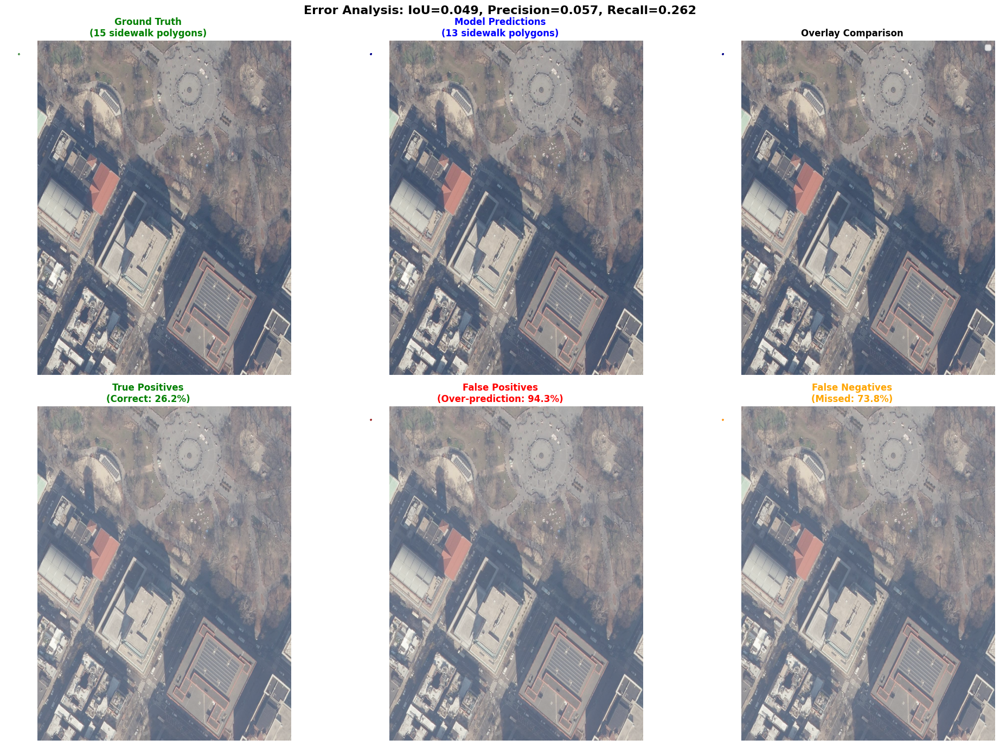

In [49]:
from shapely.ops import unary_union

# Merge geometries
gt_union = unary_union(sidewalks_gdf.geometry)
pred_union = unary_union(pred_sidewalks.geometry)

# Calculate errors
intersection = gt_union.intersection(pred_union)
false_positive = pred_union.difference(gt_union)
false_negative = gt_union.difference(pred_union)

# Create GeoDataFrames for plotting
tp_gdf = gpd.GeoDataFrame(geometry=[intersection], crs='EPSG:4326')
fp_gdf = gpd.GeoDataFrame(geometry=[false_positive], crs='EPSG:4326')
fn_gdf = gpd.GeoDataFrame(geometry=[false_negative], crs='EPSG:4326')

# Visualize
fig, axes = plt.subplots(2, 3, figsize=(20, 14))

# Row 1: Overlays on image
axes[0, 0].imshow(nyc_img, alpha=0.8)
sidewalks_gdf.plot(ax=axes[0, 0], color='lime', alpha=0.7, edgecolor='darkgreen', linewidth=2)
axes[0, 0].set_title('Ground Truth\n(15 sidewalk polygons)', fontsize=12, fontweight='bold', color='green')
axes[0, 0].axis('off')

axes[0, 1].imshow(nyc_img, alpha=0.8)
pred_sidewalks.plot(ax=axes[0, 1], color='blue', alpha=0.7, edgecolor='darkblue', linewidth=2)
axes[0, 1].set_title('Model Predictions\n(13 sidewalk polygons)', fontsize=12, fontweight='bold', color='blue')
axes[0, 1].axis('off')

axes[0, 2].imshow(nyc_img, alpha=0.8)
sidewalks_gdf.plot(ax=axes[0, 2], color='lime', alpha=0.5, edgecolor='darkgreen', linewidth=2, label='Ground Truth')
pred_sidewalks.plot(ax=axes[0, 2], color='blue', alpha=0.5, edgecolor='darkblue', linewidth=2, label='Prediction')
axes[0, 2].set_title('Overlay Comparison', fontsize=12, fontweight='bold')
axes[0, 2].legend(loc='upper right')
axes[0, 2].axis('off')

# Row 2: Error analysis
axes[1, 0].imshow(nyc_img, alpha=0.7)
tp_gdf.plot(ax=axes[1, 0], color='green', alpha=0.8, edgecolor='darkgreen', linewidth=2)
axes[1, 0].set_title(f'True Positives\n(Correct: {intersection.area/gt_union.area*100:.1f}%)', fontsize=12, fontweight='bold', color='green')
axes[1, 0].axis('off')

axes[1, 1].imshow(nyc_img, alpha=0.7)
fp_gdf.plot(ax=axes[1, 1], color='red', alpha=0.8, edgecolor='darkred', linewidth=2)
axes[1, 1].set_title(f'False Positives\n(Over-prediction: {false_positive.area/pred_union.area*100:.1f}%)', fontsize=12, fontweight='bold', color='red')
axes[1, 1].axis('off')

axes[1, 2].imshow(nyc_img, alpha=0.7)
fn_gdf.plot(ax=axes[1, 2], color='orange', alpha=0.8, edgecolor='darkorange', linewidth=2)
axes[1, 2].set_title(f'False Negatives\n(Missed: {false_negative.area/gt_union.area*100:.1f}%)', fontsize=12, fontweight='bold', color='orange')
axes[1, 2].axis('off')

plt.suptitle(f'Error Analysis: IoU={intersection.area/(gt_union.area + pred_union.area - intersection.area):.3f}, Precision={intersection.area/pred_union.area:.3f}, Recall={intersection.area/gt_union.area:.3f}', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

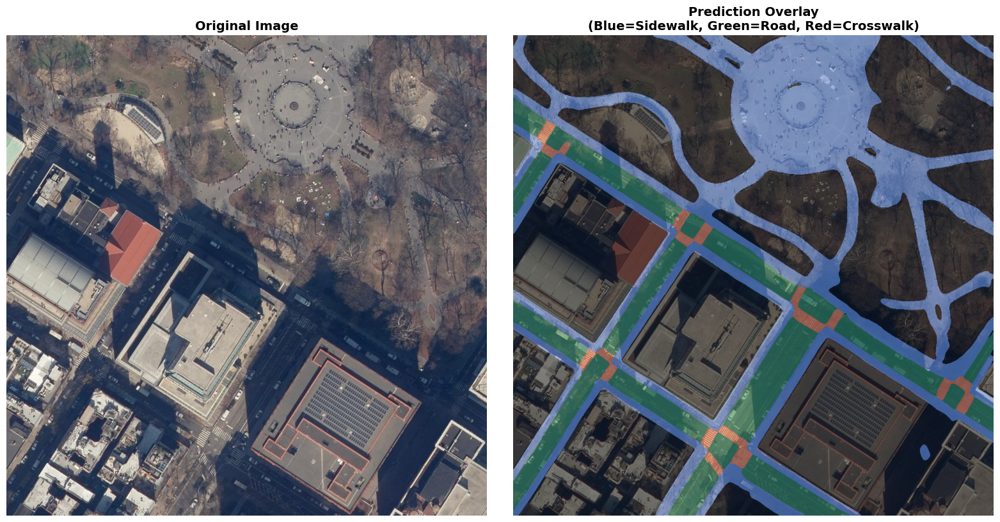

In [53]:
# Show the actual prediction mask with class labels
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(nyc_img)
axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Create colored overlay (fix: convert PIL Image to numpy array)
overlay = nyc_img_array.copy().astype(float) / 255.0
class_colors_rgb = {
  0: [0.39, 0.58, 0.93],  # Sidewalk: cornflowerblue
  1: [0.18, 0.55, 0.34],  # Road: darkseagreen  
  2: [1.0, 0.50, 0.31],   # Crosswalk: coral
  3: [0.0, 0.0, 0.0]      # Background: transparent
}

mask_overlay = np.zeros_like(overlay)
for i in range(3):  # Skip background
  class_mask = nyc_pred_mask == i
  for c in range(3):
      mask_overlay[:, :, c][class_mask] = class_colors_rgb[i][c]

# Blend
blended = 0.5 * overlay + 0.5 * mask_overlay

axes[1].imshow(blended)
axes[1].set_title('Prediction Overlay\n(Blue=Sidewalk, Green=Road, Red=Crosswalk)',
               fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

False positive pixels: 256,195 (24.4%)


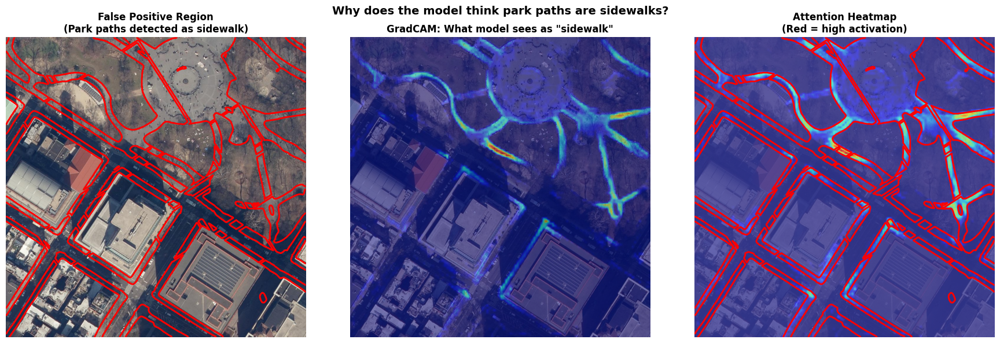

In [55]:
#Identify a false positive region (park path) and run GradCAM on it
# Create a mask for false positive areas
from shapely.geometry import box

# Get a false positive pixel location (in the park)
fp_mask = np.zeros_like(nyc_pred_mask, dtype=bool)

# Rasterize the false positive geometry
from rasterio.features import rasterize
fp_raster = rasterize(
  [(false_positive, 1)],
  out_shape=nyc_pred_mask.shape,
  transform=transform,
  fill=0,
  dtype='uint8'
)

fp_mask = fp_raster > 0

print(f"False positive pixels: {fp_mask.sum():,} ({fp_mask.sum()/fp_mask.size*100:.1f}%)")

# Run GradCAM on false positive region
target_class = 0  # Sidewalk
targets = [SemanticSegmentationTarget(target_class, fp_mask)]

# Generate CAM
target_layer = [wrapped_net.backbone.stage4[-1].branches[0][-1]]
cam = GradCAM(model=wrapped_net, target_layers=target_layer)
grayscale_cam = cam(input_tensor=nyc_input_tensor, targets=targets)[0]
cam_image = show_cam_on_image(nyc_img_normalized, grayscale_cam, use_rgb=True)

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(nyc_img)
axes[0].contour(fp_mask, colors='red', linewidths=2)
axes[0].set_title('False Positive Region\n(Park paths detected as sidewalk)',
               fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(cam_image)
axes[1].set_title('GradCAM: What model sees as "sidewalk"',
               fontsize=12, fontweight='bold')
axes[1].axis('off')

axes[2].imshow(nyc_img, alpha=0.6)
axes[2].imshow(grayscale_cam, cmap='jet', alpha=0.6)
axes[2].contour(fp_mask, colors='red', linewidths=2)
axes[2].set_title('Attention Heatmap\n(Red = high activation)',
               fontsize=12, fontweight='bold')
axes[2].axis('off')

plt.suptitle('Why does the model think park paths are sidewalks?',
          fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

del cam